In [6]:
from pathlib import Path
import os
data = Path('gtzan/gtzan_blues_00000/track.npy')
#dataset, filename = str(data).split("/", 1)
dataset, filename = str(data).split(os.sep, 1)
print(dataset, filename)

gtzan gtzan_blues_00000\track.npy


In [ ]:
from beat_this.inference import File2Beats
#from beat_this.e import File2File
import IPython.display as ipd
import librosa
from IPython.display import Audio
import numpy as np

In [2]:
# def get_file(i):
#     if i < 10:
#         return f"data/annotations/gtzan/annotations/beats/gtzan_blues_0000{i}.beats"
#     else:
#         return f"data/annotations/gtzan/annotations/beats/gtzan_blues_000{i}.beats"
def get_track(i):
    if i < 10:
        return f"gtzan\\gtzan_blues_0000{i}\\track.npy"
        
def get_audio_file(i, genre):
    if i < 10:
        i = "0" + str(i)
    return f"data/gtzan_old/{genre}/{genre}.000{i}.wav"


def get_files(i, genre):
    if i < 10:
        return  f"data/annotations/gtzan/annotations/beats/gtzan_{genre}_0000{i}.beats", f"gtzan\\gtzan_{genre}_0000{i}\\track.npy", f"data/gtzan_old/{genre}/{genre}.0000{i}.wav"
    else:
        return f"data/annotations/gtzan/annotations/beats/gtzan_{genre}_000{i}.beats", f"gtzan\\gtzan_{genre}_000{i}\\track.npy", f"data/gtzan_old/{genre}/{genre}.000{i}.wav"

In [2]:
import IPython.display as ipd
import librosa
import numpy as np
import soundfile as sf

import cProfile
import pstats


#audio_file =r"C:\Users\polin\Music\Database" + "\\allegro.mp3"
audio_file = "data/gtzan/blues.00000.wav"
file2beats = File2Beats(checkpoint_path="final0", dbn=False)
beats, downbeats = file2beats(audio_file)
print("First 20 beats", beats)
print("First 20 downbeats", downbeats[:20])

audio, sr = sf.read(audio_file)
# make it mono if stereo
if len(audio.shape) > 1:
  audio = np.mean(audio, axis=1)

# sonify the beats and downbeats
# remove the beats that are also downbeats for a nicer sonification
beats = [b for b in beats if b not in downbeats]
audio_beat = librosa.clicks(times = beats, sr=sr, click_freq=1000, length=len(audio))
audio_downbeat = librosa.clicks(times = downbeats, sr=sr, click_freq=1000, length=len(audio))
ipd.display(ipd.Audio(audio + audio_beat + audio_downbeat, rate=sr))


20251712
torch.Size([1500, 128])
First 20 beats [ 0.24  0.7   1.18  1.66  2.14  2.62  3.1   3.58  4.06  4.54  5.02  5.5
  5.98  6.48  6.96  7.44  7.92  8.4   8.88  9.36  9.84 10.32 10.8  11.28
 11.76 12.24 12.72 13.2  13.68 14.16 14.64 15.12 15.58 16.06 16.52 17.
 17.48 17.96 18.44 18.94 19.4  19.88 20.36 20.82 21.3  21.78 22.26 22.74
 23.22 23.7  24.18 24.66 25.14 25.64 26.12 26.6  27.08 27.56 28.04 28.54
 29.02 29.5  29.98]
First 20 downbeats [ 0.24  1.18  2.14  3.1   4.06  5.02  5.98  6.96  7.92  8.88  9.84 10.8
 11.76 12.72 13.68 14.64 15.58 16.52 17.48 18.44]


In [4]:
import IPython.display as ipd
import librosa
import numpy as np
import soundfile as sf
from beat_this.inference import File2Beats

import cProfile
import pstats


#audio_file =r"C:\Users\polin\Music\Database" + "\\allegro.mp3"
audio_file = "data/gtzan/blues.00000.wav"
file2beats = File2Beats(checkpoint_path="final0", dbn=False)
beats, downbeats = file2beats(audio_file)
print("First 20 beats", beats)
print("First 20 downbeats", downbeats[:20])

audio, sr = sf.read(audio_file)
# make it mono if stereo
if len(audio.shape) > 1:
  audio = np.mean(audio, axis=1)

# sonify the beats and downbeats
# remove the beats that are also downbeats for a nicer sonification
beats = [b for b in beats if b not in downbeats]
audio_beat = librosa.clicks(times = beats, sr=sr, click_freq=1000, length=len(audio))
#audio_downbeat = librosa.clicks(times = downbeats, sr=sr, click_freq=1000, length=len(audio))



ModuleNotFoundError: No module named 'rotary_embedding_torch'

with c profiler:

In [ ]:
import IPython.display as ipd
import librosa
import numpy as np
import soundfile as sf

import cProfile
import pstats

profiler = cProfile.Profile()
profiler.enable()


#audio_file =r"C:\Users\polin\Music\Database" + "\\allegro.mp3"
audio_file = "data/gtzan/blues.00000.wav"
file2beats = File2Beats(checkpoint_path="final0", dbn=False)
beats, downbeats = file2beats(audio_file)
# print("First 20 beats", beats)
# print("First 20 downbeats", downbeats[:20])

# audio, sr = sf.read(audio_file)
# # make it mono if stereo
# if len(audio.shape) > 1:
#   audio = np.mean(audio, axis=1)

# # sonify the beats and downbeats
# # remove the beats that are also downbeats for a nicer sonification
# beats = [b for b in beats if b not in downbeats]
# audio_beat = librosa.clicks(times = beats, sr=sr, click_freq=1000, length=len(audio))
# audio_downbeat = librosa.clicks(times = downbeats, sr=sr, click_freq=1000, length=len(audio))
# ipd.display(ipd.Audio(audio + audio_beat + audio_downbeat, rate=sr))


profiler.disable()
stats = pstats.Stats(profiler).sort_stats("cumulative")
stats.print_stats(20)


In [4]:
import os

# Path to your GTZAN beat annotation files
beat_files_path = "annotations/gtzan/annotations/beats"

# List all .beat files
beat_files = [f for f in os.listdir(beat_files_path) if f.endswith(".beats")]

file_path = os.path.join(beat_files_path, beat_files[0])  # Select one file

with open(file_path, "r") as f:
    lines = f.readlines()

print("First few lines:", lines[:5])

FileNotFoundError: [WinError 3] The system cannot find the path specified: 'annotations/gtzan/annotations/beats'

In [5]:
lst

['001039/track',
 '001039/track_ps-1',
 '001039/track_ps1',
 '001039/track_ts-1',
 '001039/track_ts1',
 '001039/track_ns1',
 '001040/track',
 '001040/track_ps-1',
 '001040/track_ps1',
 '001040/track_ts-1',
 '001040/track_ts1',
 '001040/track_ns1',
 '001066/track',
 '001066/track_ps-1',
 '001066/track_ps1',
 '001066/track_ts-1',
 '001066/track_ts1',
 '001066/track_ns1']

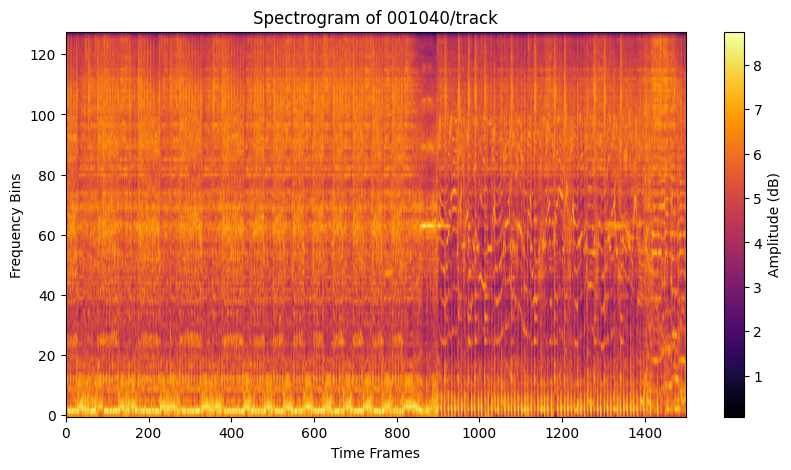

(128, 1499)

In [1]:
from numpy import load
import matplotlib.pyplot as plt
data = load(r"P:\datasets\geenres\fma\fma_small\fma_small\audio\spectrograms\try.npz")
lst = data.files
#item = "gtzan_blues_00099/track"
# for item in lst:
#     print(item)
item = "001040/track"
spectrogram = data[item].transpose()
plt.figure(figsize=(10, 5))
plt.imshow(spectrogram, aspect='auto', origin='lower', cmap='inferno')  # 'inferno' works well for spectrograms
plt.colorbar(label="Amplitude (dB)")
plt.xlabel("Time Frames")
plt.ylabel("Frequency Bins")
plt.title(f"Spectrogram of {item}")
plt.show()
spectrogram.shape

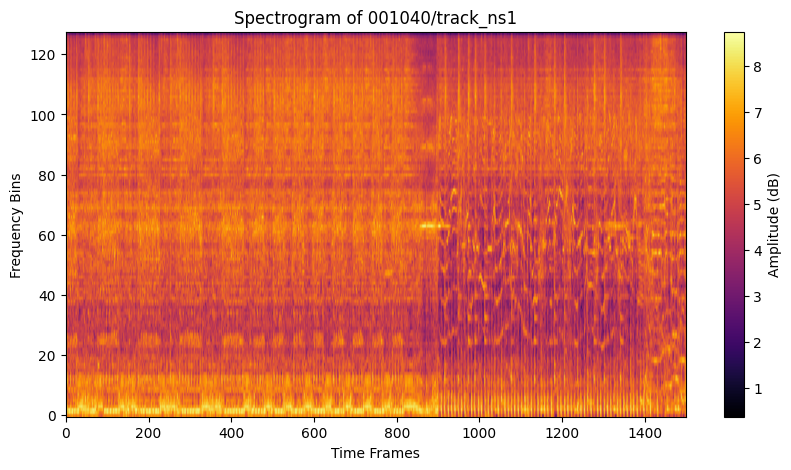

(128, 1499)

In [2]:
from numpy import load
import matplotlib.pyplot as plt
data = load(r"P:\datasets\geenres\fma\fma_small\fma_small\audio\spectrograms\try.npz")
lst = data.files
#item = "gtzan_blues_00099/track"
# for item in lst:
#     print(item)
item = "001040/track_ns1"
spectrogram = data[item].transpose()
plt.figure(figsize=(10, 5))
plt.imshow(spectrogram, aspect='auto', origin='lower', cmap='inferno')  # 'inferno' works well for spectrograms
plt.colorbar(label="Amplitude (dB)")
plt.xlabel("Time Frames")
plt.ylabel("Frequency Bins")
plt.title(f"Spectrogram of {item}")
plt.show()
spectrogram.shape

In [18]:
import numpy as np
for key in data.keys():
    key_old = key
    key = key[:key.index("/track")]
    output_subdir = os.path.join("data/audio/spectrograms/gtzan/", key)
    print(output_subdir)
    os.makedirs(output_subdir, exist_ok=True)

    np.save(os.path.join(output_subdir, "track.npy"), data[key_old])
    print(f"Saved {key} to {output_subdir}/track.npy")

data/audio/spectrograms/gtzan/gtzan_blues_00000
Saved gtzan_blues_00000 to data/audio/spectrograms/gtzan/gtzan_blues_00000/track.npy
data/audio/spectrograms/gtzan/gtzan_blues_00001
Saved gtzan_blues_00001 to data/audio/spectrograms/gtzan/gtzan_blues_00001/track.npy
data/audio/spectrograms/gtzan/gtzan_blues_00002
Saved gtzan_blues_00002 to data/audio/spectrograms/gtzan/gtzan_blues_00002/track.npy
data/audio/spectrograms/gtzan/gtzan_blues_00003
Saved gtzan_blues_00003 to data/audio/spectrograms/gtzan/gtzan_blues_00003/track.npy
data/audio/spectrograms/gtzan/gtzan_blues_00004
Saved gtzan_blues_00004 to data/audio/spectrograms/gtzan/gtzan_blues_00004/track.npy
data/audio/spectrograms/gtzan/gtzan_blues_00005
Saved gtzan_blues_00005 to data/audio/spectrograms/gtzan/gtzan_blues_00005/track.npy
data/audio/spectrograms/gtzan/gtzan_blues_00006
Saved gtzan_blues_00006 to data/audio/spectrograms/gtzan/gtzan_blues_00006/track.npy
data/audio/spectrograms/gtzan/gtzan_blues_00007
Saved gtzan_blues_000

In [14]:
res = key[:key.index("/track")]
res

'gtzan_rock_00099'

In [4]:
from beat_this.model.pl_module import PLBeatThis
plt = PLBeatThis()

c:\Polina\master\thesis\beat_this\beat_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
def get_files(i, genre):
    if i < 10:
        return  f"data/annotations/gtzan/annotations/beats/gtzan_{genre}_0000{i}.beats", f"gtzan\\gtzan_{genre}_0000{i}\\track.npy", f"data/gtzan_old/{genre}/{genre}.0000{i}.wav"
    else:
        return f"data/annotations/gtzan/annotations/beats/gtzan_{genre}_000{i}.beats", f"gtzan\\gtzan_{genre}_000{i}\\track.npy", f"data/gtzan_old/{genre}/{genre}.000{i}.wav"

In [8]:
from tqdm import tqdm
from beat_this.model.pl_module import PLBeatThis
import numpy as np
piece = []
truth_dict = {}
num_tracks = 100
out = []
all_f1 = []
pl = PLBeatThis()
genres = ["reggae", "rock"]
file2beats = File2Beats(checkpoint_path="final0", dbn=False)
for genre in genres:
    print(f"prediction for {genre}")
    for i in tqdm(range(num_tracks)):
        numb_file = i
        #file = get_file(numb_file)
        #track = get_track(numb_file)
        file, track, audio_file = get_files(numb_file, genre)
        try:
            with open (file, "r", encoding = "utf-8") as f:
                ground_truth = np.array([float(line.split()[0]) for line in f.readlines()])
                truth_dict[numb_file] = ground_truth
                f.close()
            piece.append(track)
            #audio_file = get_audio_file(numb_file)
        
            beats, downbeats = file2beats(audio_file)
            res = pl.metrics(ground_truth, beats, step = 'test') 
            res['Cemgil'] = res['Cemgil'][0]
            out.append(res)
        except Exception as e:
            print(e)
            print(f"something went wrong with the file {audio_file}")
    metrics = {key: [d[key] for d in out ] for key in out[0].keys()}
    averaged_metrics = {k: np.mean(v) for k, v in metrics.items()}
    all_f1.append(averaged_metrics["F-measure"])
    print(f"Metrics (beat) for {genre}")
    for k, v in averaged_metrics.items():
        print(f"{k}: {v}")
print(all_f1)

prediction for reggae


 86%|████████▌ | 86/100 [05:52<00:56,  4.06s/it]

[Errno 2] No such file or directory: 'data/annotations/gtzan/annotations/beats/gtzan_reggae_00086.beats'
something went wrong with the file data/gtzan_old/reggae/reggae.00086.wav


100%|██████████| 100/100 [06:45<00:00,  4.05s/it]


Metrics (beat) for reggae
F-measure: 0.9071859829072542
Cemgil: 0.8416789458162728
CMLt: 0.7422681926728693
AMLt: 0.9691656568437022
prediction for rock


100%|██████████| 100/100 [07:20<00:00,  4.40s/it]

Metrics (beat) for rock
F-measure: 0.9184198989060124
Cemgil: 0.8400119353222106
CMLt: 0.8051376663490964
AMLt: 0.946435521892049
[0.9071859829072542, 0.9184198989060124]


In [4]:
import numpy as np
scores = [ 0.6590905990631122,  0.8310827985672785,  0.8692074875664891, 0.8729010246355573, 0.8997744879272745,  0.9071859829072542, 0.9184198989060124,  0.9436362917863831,  0.9662215496566966,
         0.974604722605066, ]
np.mean(np.array(scores))

0.8842124843621125

In [5]:
genres = [ "classical",  "blues","jazz", "metal", "pop", "reggae", "rock", "country", "disco", "Hip-Hop"]
genres = [genre.title() for genre in genres]
genres_results = dict(zip(genres,scores))
genres_results

{'Classical': 0.6590905990631122,
 'Blues': 0.8310827985672785,
 'Jazz': 0.8692074875664891,
 'Metal': 0.8729010246355573,
 'Pop': 0.8997744879272745,
 'Reggae': 0.9071859829072542,
 'Rock': 0.9184198989060124,
 'Country': 0.9436362917863831,
 'Disco': 0.9662215496566966,
 'Hip-Hop': 0.974604722605066}

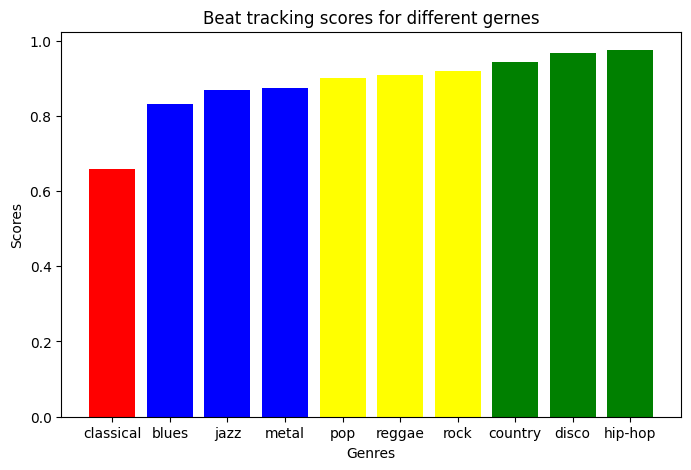

In [16]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 5))
colors = []
for score in genres_results.values():
    if score < 0.7:
        colors.append('red')
    elif score > 0.94:
        colors.append('green')

    elif score > 0.88:
        colors.append('yellow')
    else:
        colors.append('blue')
plt.bar(genres_results.keys(), genres_results.values(), color = colors)
plt.xlabel('Genres')
plt.ylabel('Scores')
#plt.ylim(0.6,1)
plt.title('Beat tracking scores for different gernes')
plt.show()


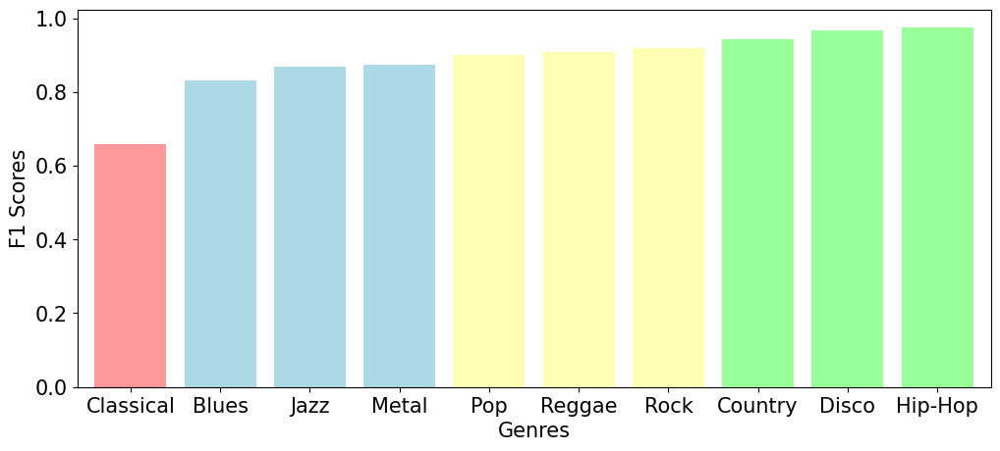

In [4]:
import matplotlib.pyplot as plt
import matplotlib

plt.figure(figsize=(12, 5))
colors = []

# Define pastel shades
pastel_red = '#ff9999'
pastel_green = '#99ff99'
pastel_yellow = '#ffffb3'
pastel_blue = '#add8e6'
matplotlib.rcParams.update({'font.size': 15})
for score in genres_results.values():
    if score < 0.7:
        colors.append(pastel_red)
    elif score > 0.94:
        colors.append(pastel_green)
    elif score > 0.88:
        colors.append(pastel_yellow)
    else:
        colors.append(pastel_blue)

plt.bar(genres_results.keys(), genres_results.values(), color=colors)
plt.xlabel('Genres')
plt.ylabel('F1 Scores')
plt.margins(x=0.02)

#plt.savefig("gtzan_genres.pdf", bbox_inches="tight")
# plt.ylim(0.6, 1)
#plt.title('Beat tracking scores for different genres')
plt.show()

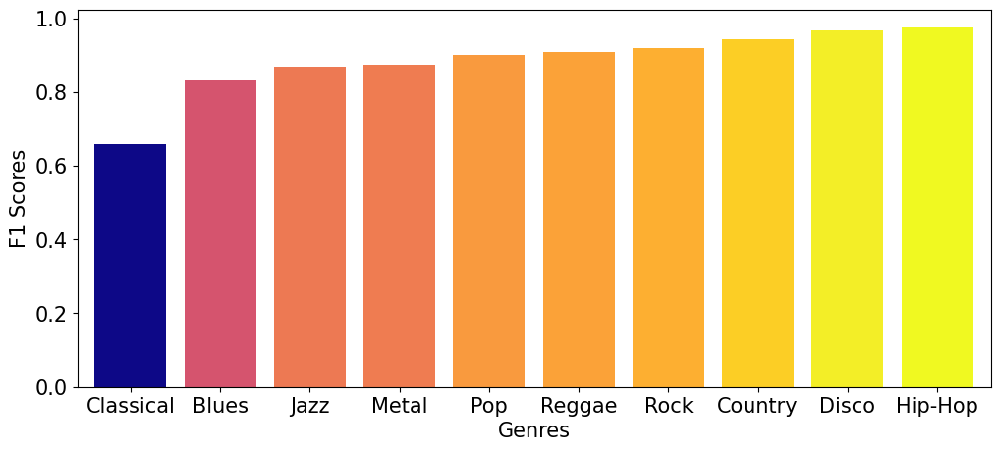

In [6]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np

plt.figure(figsize=(12, 5))
matplotlib.rcParams.update({'font.size': 15})

scores = list(genres_results.values())
keys = list(genres_results.keys())

# Choose a colormap (e.g., coolwarm, viridis, plasma, RdYlGn)
cmap = plt.cm.plasma

# Normalize scores between min and max
norm = plt.Normalize(min(scores), max(scores))

# Map each score to a color
colors = cmap(norm(scores))

plt.bar(keys, scores, color=colors)
plt.xlabel('Genres')
plt.ylabel('F1 Scores')
plt.margins(x=0.02)

# Add colorbar to show mapping
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # required for colorbar
#plt.colorbar(sm, label="F1 Score")
#plt.savefig("gtzan_genres_newcmap.pdf", bbox_inches="tight")
plt.show()


# some plots

In [137]:
from beat_this.model.pl_module import PLBeatThis
import numpy as np
plt1 = PLBeatThis()
with open ("data/annotations/gtzan/annotations/beats/gtzan_blues_00001.beats", "r", encoding = "utf-8") as f:
    ground_truth = np.array([float(line.split()[0]) for line in f.readlines()])
    f.close()
# with open ("data/annotations/gtzan/annotations/beats/gtzan_blues_00002.beats", "r", encoding = "utf-8") as f:
#     ground_truth = np.array([float(line.split()[0]) for line in f.readlines()])
#     f.close()
#print(ground_truth)
# truth = np.array([ 5.306,  6.14 ,  7.007,  7.895,  8.778,  9.66 , 10.548, 11.425,
#        12.313, 13.195, 14.084, 14.966, 15.854, 16.742, 17.625, 18.513,
#        19.407, 20.265, 21.159, 22.053, 22.946, 23.851, 24.745, 25.638,
#        26.538, 27.447, 28.335, 29.24 ])
preds = np.array([ 0.04,  0.94,  1.82,  2.7 ,  3.56,  4.44,  
5.32,  6.16,  7.04,
        7.9 ,  8.78,  9.66, 10.58, 11.46, 12.32, 13.2 , 14.1 , 14.98,
       15.86, 16.74, 17.6 , 18.54, 19.4 , 20.3 , 21.22, 21.88, 22.04,
       22.96, 23.86, 24.72, 25.64, 26.56, 27.46, 28.36, 28.96])
audio_file = "data/gtzan/blues.00001.wav"
file2beats = File2Beats(checkpoint_path="final0", dbn=False)
beats, downbeats = file2beats(audio_file)
res = plt1.metrics(ground_truth, beats, step = 'test')
print(res)

{'F-measure': 0.9824561403508771, 'Cemgil': (0.9459178028210458, 0.9459178028210458), 'CMLt': 0.9655172413793104, 'AMLt': 0.9655172413793104}


In [ ]:
np.set_printoptions(suppress=True)
beats

array([ 0.02,  0.92,  1.82,  2.68,  3.56,  4.14,  4.44,  5.3 ,  6.16,
        7.02,  7.88,  8.76,  9.66, 10.56, 11.44, 12.32, 13.2 , 14.08,
       14.96, 15.84, 16.74, 17.62, 18.52, 19.4 , 20.28, 21.18, 22.04,
       22.94, 23.84, 24.74, 25.64, 26.54, 27.44, 28.34, 29.26, 29.84])

In [91]:
preds = np.array([ 0.04,  0.94,  1.82,  2.7 ,  3.56,  4.44,  
5.32,  6.16,  7.04,
        7.9 ,  8.78,  9.66, 10.58, 11.46, 12.32, 13.2 , 14.1 , 14.98,
       15.86, 16.74, 17.6 , 18.54, 19.4 , 20.3 , 21.22, 21.88, 22.04,
       22.96, 23.86, 24.72, 25.64, 26.56, 27.46, 28.36, 28.96, 29.24])

In [140]:
beats= np.delete(beats, 5)

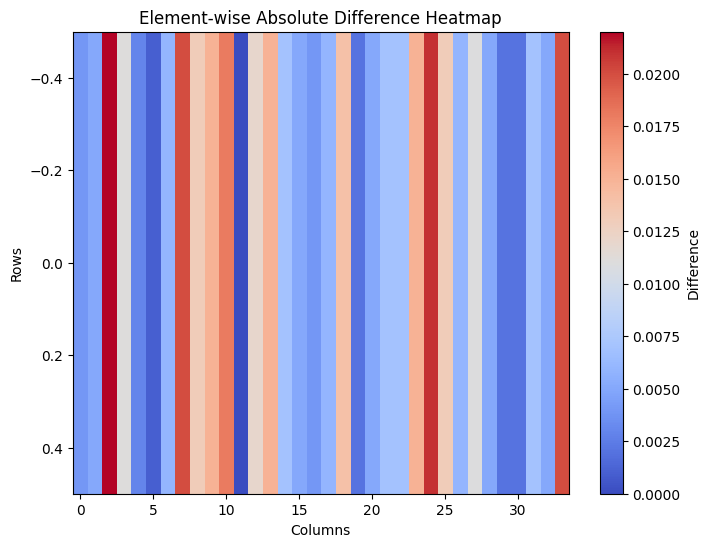

In [142]:

import matplotlib.pyplot as plt
difference = np.abs(beats[:34] - ground_truth[:34])
if difference.ndim == 1:
    difference = difference.reshape(1, -1)
# Plot heatmap
plt.figure(figsize=(8, 6))
plt.imshow(difference, cmap="coolwarm", aspect="auto")
plt.colorbar(label="Difference")
plt.title("Element-wise Absolute Difference Heatmap")
plt.xlabel("Columns")
plt.ylabel("Rows")
plt.show()

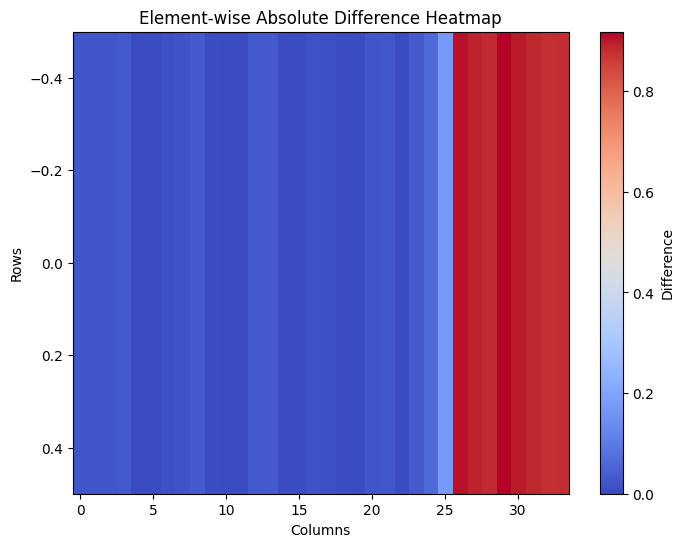

In [143]:
difference = np.abs(preds[:34] - ground_truth[:34])
if difference.ndim == 1:
    difference = difference.reshape(1, -1)
# Plot heatmap
plt.figure(figsize=(8, 6))
plt.imshow(difference, cmap="coolwarm", aspect="auto")
plt.colorbar(label="Difference")
plt.title("Element-wise Absolute Difference Heatmap")
plt.xlabel("Columns")
plt.ylabel("Rows")
plt.show()

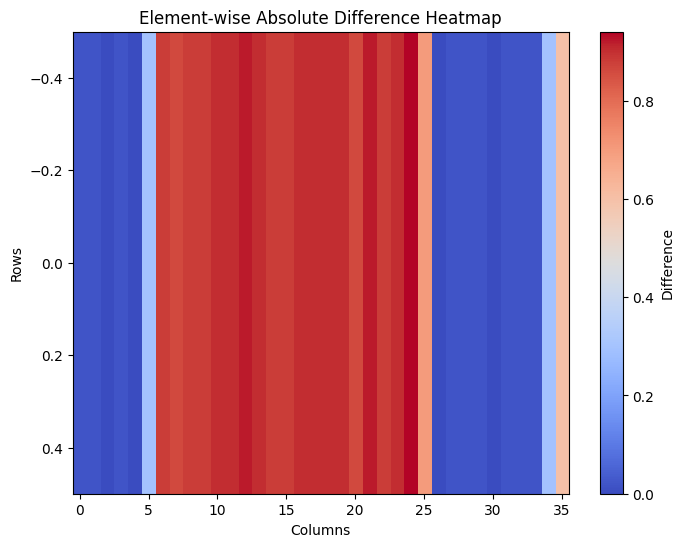

In [96]:

import matplotlib.pyplot as plt
difference = np.abs(beats - preds)
if difference.ndim == 1:
    difference = difference.reshape(1, -1)
# Plot heatmap
plt.figure(figsize=(8, 6))
plt.imshow(difference, cmap="coolwarm", aspect="auto")
plt.colorbar(label="Difference")
plt.title("Element-wise Absolute Difference Heatmap")
plt.xlabel("Columns")
plt.ylabel("Rows")
plt.show()

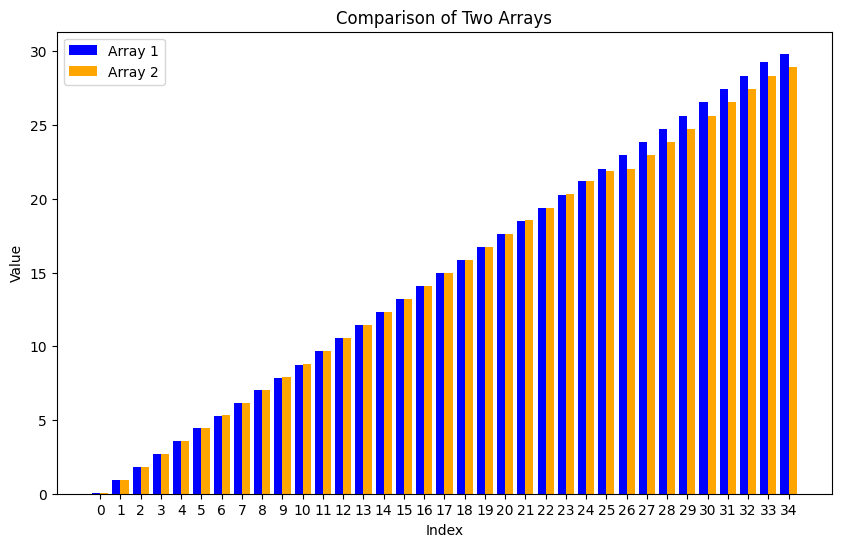

In [144]:
indices = np.arange(len(beats))  # X positions (0, 1, 2, ...)

# Width of each bar
bar_width = 0.4

plt.figure(figsize=(10, 6))

# Plot bars for array1
plt.bar(indices - bar_width / 2, beats, width=bar_width, label='Array 1', color='blue')

# Plot bars for array2, shifted to the right
plt.bar(indices + bar_width / 2, preds, width=bar_width, label='Array 2', color='orange')

# Add labels and title
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("Comparison of Two Arrays")
plt.xticks(indices)  # Set X-ticks to the indices
plt.legend()

# Show the plot
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Example arrays (replace with your real data)
array1 = np.random.rand(128, 128)
array2 = array1 + np.random.normal(0, 0.1, (128, 128))  # Slightly noisy version of array1

# Compute absolute difference
difference = np.abs(array1 - array2)

# Plot heatmap
plt.figure(figsize=(8, 6))
plt.imshow(difference, cmap="coolwarm", aspect="auto")
plt.colorbar(label="Difference")
plt.title("Element-wise Absolute Difference Heatmap")
plt.xlabel("Columns")
plt.ylabel("Rows")
plt.show()

In [15]:
with open ("data/annotations/gtzan/annotations/beats/gtzan_blues_00001.beats", "r", encoding = "utf-8") as f:
    ground_truth = np.array([float(line.split()[0]) for line in f.readlines()])
print(ground_truth)

[1.6000e-02 9.1500e-01 1.7980e+00 2.6690e+00 3.5630e+00 4.4410e+00
 5.3060e+00 6.1400e+00 7.0070e+00 7.8950e+00 8.7780e+00 9.6600e+00
 1.0548e+01 1.1425e+01 1.2313e+01 1.3195e+01 1.4084e+01 1.4966e+01
 1.5854e+01 1.6742e+01 1.7625e+01 1.8513e+01 1.9407e+01 2.0265e+01
 2.1159e+01 2.2053e+01 2.2946e+01 2.3851e+01 2.4745e+01 2.5638e+01
 2.6538e+01 2.7447e+01 2.8335e+01 2.9240e+01]


# generated track

In [3]:
orignial_beats = [ 0.22, 0.72, 1.18, 1.66, 2.16, 2.62, 3.1, 3.6, 4.08, 4.56, 5.04, 5.52, 6., 6.48, 6.96 ,7.44, 7.92, 8.4, 8.88 ,9.36, 9.84 ]
len(orignial_beats)

21

In [ ]:
import IPython.display as ipd
import librosa
import numpy as np
import soundfile as sf


#audio_file =r"C:\Users\polin\Music\Database" + "\\allegro.mp3"
audio_file = "data/generated/pop.mp3"
#audio_file = "data/gtzan_old/blues/blues.00001.wav"
file2beats = File2Beats(checkpoint_path="final2", dbn=False)
beats, downbeats = file2beats(audio_file)
print("First 20 beats", beats[:21])
print("First 20 downbeats", downbeats[:21])

audio, sr = sf.read(audio_file)
# make it mono if stereo
if len(audio.shape) > 1:
  audio = np.mean(audio, axis=1)

# sonify the beats and downbeats
# remove the beats that are also downbeats for a nicer sonification
beats = [b for b in beats if b not in downbeats]
audio_beat = librosa.clicks(times = beats, sr=sr, click_freq=1000, length=len(audio))
audio_downbeat = librosa.clicks(times = downbeats, sr=sr, click_freq=1000, length=len(audio))
ipd.display(ipd.Audio(audio + audio_beat + audio_downbeat, rate=sr))

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
def plot_beats_intervals(beats_dynamic, audio_file):
    numbers = beats_dynamic[-30:]
    # Calculate differences between consecutive numbers
    differences = np.diff(numbers)

    # Create the plot
    fig, ax = plt.subplots(figsize=(25, 5))

    # Plot points
    ax.scatter(numbers, [0] * len(numbers), color='blue', label='Numbers')

    # Draw vertical lines for each point
    for i, x in enumerate(numbers):
        ax.vlines(x, ymin=0, ymax=0.1, color='gray')

    # Annotate gaps between points
    for i in range(len(numbers) - 1):
        mid = (numbers[i] + numbers[i + 1]) / 2
        ax.text(mid, 0.05, f"{round(differences[i], 2)}", ha='center', va='bottom', fontsize=9, color='red')

    # Labels and title
    ax.set_yticks([])  # Remove y-axis ticks
    ax.set_xlabel('Values')
    ax.set_title(f'Visualization of Spacing Between Numbers for {audio_file}')
    ax.legend()

    # Show the plot
    plt.show()

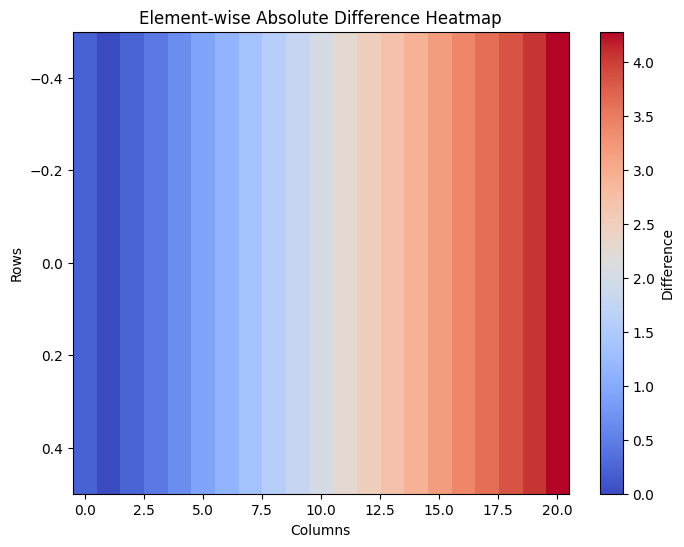

In [18]:
import matplotlib.pyplot as plt
difference = np.abs(np.array(beats[:21]) - np.array(orignial_beats))
if difference.ndim == 1:
    difference = difference.reshape(1, -1)
# Plot heatmap
plt.figure(figsize=(8, 6))
plt.imshow(difference, cmap="coolwarm", aspect="auto")
plt.colorbar(label="Difference")
plt.title("Element-wise Absolute Difference Heatmap")
plt.xlabel("Columns")
plt.ylabel("Rows")
plt.show()

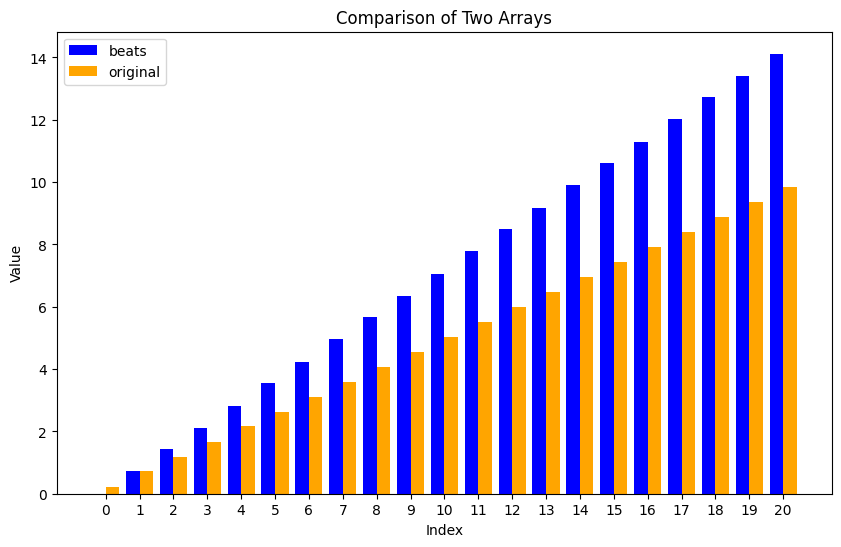

In [17]:
indices = np.arange(len(beats[:21]))  # X positions (0, 1, 2, ...)

# Width of each bar
bar_width = 0.4

plt.figure(figsize=(10, 6))

# Plot bars for array1
plt.bar(indices - bar_width / 2, beats[:21], width=bar_width, label='beats', color='blue')

# Plot bars for array2, shifted to the right
plt.bar(indices + bar_width / 2, orignial_beats, width=bar_width, label='original', color='orange')

# Add labels and title
plt.xlabel("Index")
plt.ylabel("Value")
plt.title("Comparison of Two Arrays")
plt.xticks(indices)  # Set X-ticks to the indices
plt.legend()

# Show the plot
plt.show()

# periodicity of beat

In [5]:

import librosa
import matplotlib.pyplot as plt
import numpy as np

def visualize_beats(audio_path, beat_times):
    # Load the audio file
    y, sr = librosa.load(audio_path, sr=None)

    # Create a time array for the waveform
    time = np.linspace(0, len(y) / sr, num=len(y))

    # Plot the waveform
    plt.figure(figsize=(12, 6))
    plt.plot(time, y, label='Waveform', color='gray', alpha=0.6)

    # Plot vertical lines at beat events
    for beat in beat_times:
        plt.axvline(x=beat, color='red', linestyle='--', alpha=0.7)

    plt.title('Waveform with Beat Events')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.show()

# Example usage # Replace with your actual beat times



In [6]:
import matplotlib.pyplot as plt
import numpy as np
from typing import Optional
def plot_beats_intervals(beats_dynamic, audio_file,differences: Optional[np.ndarray] = None):
    numbers = beats_dynamic[:]

        # Calculate differences between consecutive numbers
    if  differences is not None:
        differences = np.diff(numbers)
    # Calculate differences between consecutive numbers
    #differences = np.diff(numbers)

    # Create the plot
    fig, ax = plt.subplots(figsize=(25, 5))

    # Plot points
    ax.scatter(numbers, [0] * len(numbers), color='blue', label='Numbers')

    # Draw vertical lines for each point
    for i, x in enumerate(numbers):
        ax.vlines(x, ymin=0, ymax=0.1, color='gray')

    # Annotate gaps between points
    for i in range(len(numbers) - 1):
        mid = (numbers[i] + numbers[i + 1]) / 2
        ax.text(mid, 0.05, f"{round(differences[i], 2)}", ha='center', va='bottom', fontsize=9, color='red')

    # Labels and title
    ax.set_yticks([])  # Remove y-axis ticks
    ax.set_xlabel('Values')
    ax.set_title(f'Visualization of Spacing Between Numbers for {audio_file}')
    ax.legend()
    # Show the plot
    plt.show()

First 20 beats [ 0.    3.08  4.08  5.9   7.2  15.16 16.22 18.48 18.98 19.92 20.88 21.86
 22.88 23.86 25.76 29.32]
First 20 downbeats [ 0.    3.08  4.08  7.2  15.16 18.48 19.92 22.88 25.76 29.32]


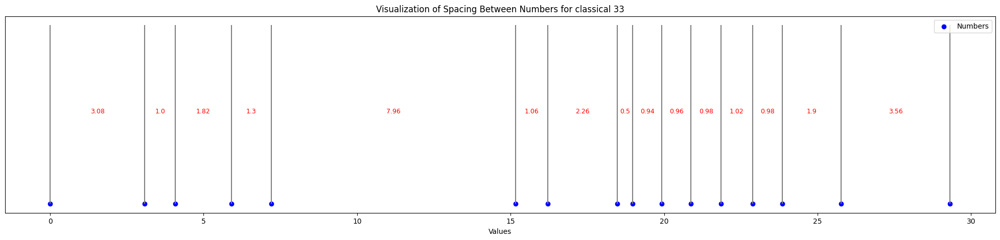

In [8]:
import IPython.display as ipd
import librosa
import numpy as np
import soundfile as sf


#audio_file =r"C:\Users\polin\Music\Database" + "\\allegro.mp3"
name = "classical"
number = "33"
#audio_file = "data/gtzan_old/disco/disco.00003.wav"
audio_file =f"data/gtzan_old/{name}/{name}.000{number}.wav"
#audio_file = "data/asap-dataset-master/Bach/Fugue/bwv_846/midi_score.mid"
file2beats = File2Beats(checkpoint_path="final0", dbn= False)
beats, downbeats = file2beats(audio_file)
print("First 20 beats", beats[:21])
print("First 20 downbeats", downbeats[:21])

audio, sr = sf.read(audio_file)
# make it mono if stereo
if len(audio.shape) > 1:
  audio = np.mean(audio, axis=1)

# sonify the beats and downbeats
# remove the beats that are also downbeats for a nicer sonification
#beats = [b for b in beats if b not in downbeats]
audio_beat = librosa.clicks(times = beats, sr=sr, click_freq=1000, length=len(audio))
audio_downbeat = librosa.clicks(times = downbeats, sr=sr, click_freq=1000, length=len(audio))
ipd.display(ipd.Audio(audio + audio_beat, rate=sr))
numbers =  beats[:]
        # Calculate differences between consecutive numbers
differences = np.diff(numbers)
plot_beats_intervals( beats[:20], name+ " "+ number, differences[:20])

In [ ]:
import soundfile as sf    # saving clicks into file
audio_beat = librosa.clicks(times = beats, sr=sr, click_freq=400, length=len(audio))
audio_downbeat = librosa.clicks(times = downbeats, sr=sr, click_freq=400, length=len(audio))
audio_together = audio_beat + audio_downbeat
ipd.display(ipd.Audio(audio_together[:sr*10], rate=sr))
sf.write("data/jasco/clicks.wav", audio_together[:sr*10], sr)

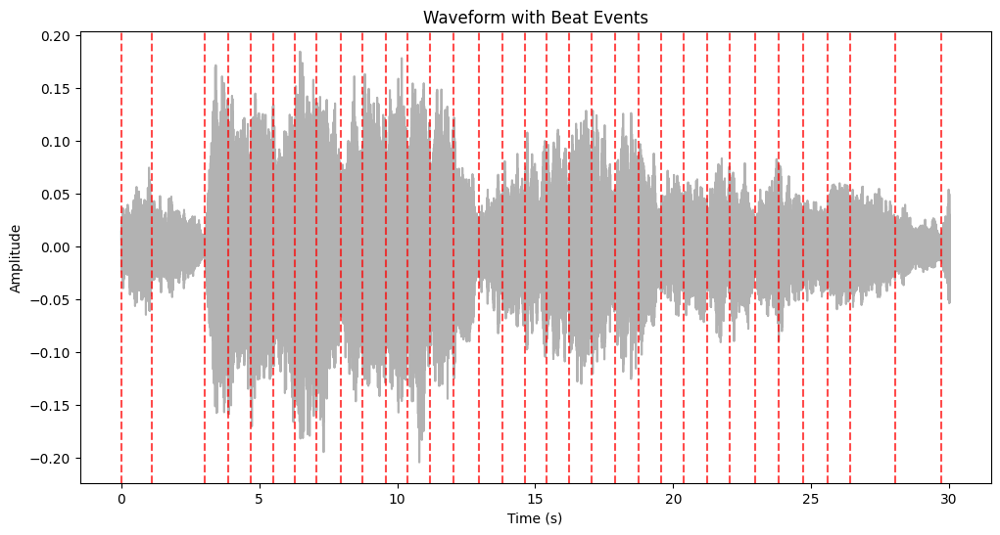

In [11]:
visualize_beats(audio_file, beats)

getting true values


In [24]:
#number = 14
#for number in range(10, 100):
with open (f"data/annotations/gtzan/annotations/beats/gtzan_classical_000{str(number)}.beats", "r") as f:
    ground_truth = np.array([float(line.split()[0]) for line in f.readlines()])
numbers =  ground_truth[:]
    # Calculate differences between consecutive numbers
differences = np.diff(numbers)
if abs(max(differences) - min(differences)) > 1:
    print(number)

#plot_beats_intervals(differences, ground_truth,f"classical_000{number}")
#audio_truth= librosa.clicks(times = ground_truth, sr=sr, click_freq=1000, length=len(audio))
#audio_downbeat = librosa.clicks(times = downbeats, sr=sr, click_freq=1000, length=len(audio))
#ipd.display(ipd.Audio(audio + audio_truth, rate=sr))

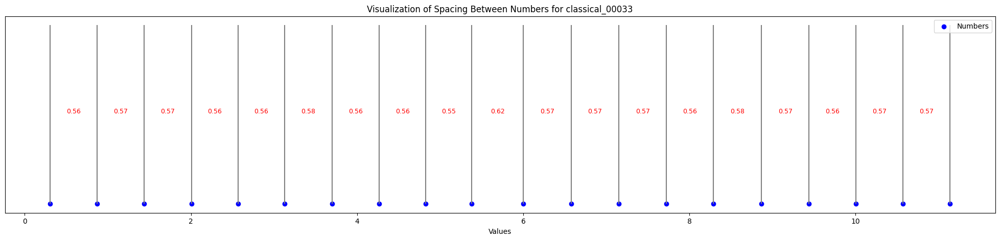

In [ ]:
#number = "47"
with open (f"data/annotations/gtzan/annotations/beats/gtzan_classical_000{number}.beats", "r") as f:
    ground_truth = np.array([float(line.split()[0]) for line in f.readlines()])
numbers =  ground_truth[:]
    # Calculate differences between consecutive numbers
differences = np.diff(numbers)
if abs(max(differences) - min(differences)) > 1:
    print(number)

audio_file =f"data/gtzan_old/{name}/{name}.000{str(number)}.wav"
audio, sr = sf.read(audio_file)

# make it mono if stereo
if len(audio.shape) > 1:
  audio = np.mean(audio, axis=1)
plot_beats_intervals( ground_truth[:20],f"classical_000{number}", differences[:20])
audio_truth= librosa.clicks(times = ground_truth, sr=sr, click_freq=1000, length=len(audio))
ipd.display(ipd.Audio(audio + audio_truth, rate=sr))

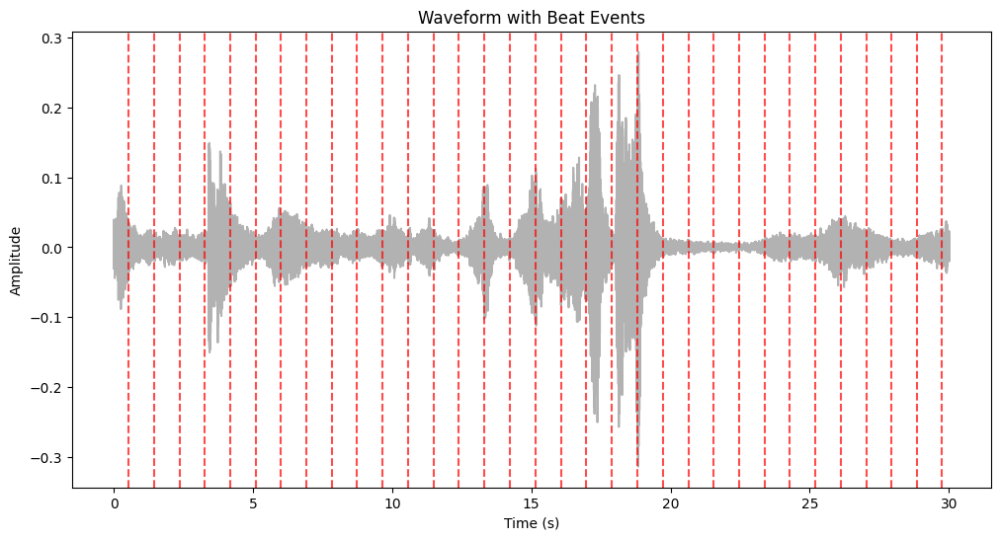

In [26]:
visualize_beats(audio_file, ground_truth)

# looking closely into specific genres and classical pieces

In [5]:
from tqdm import tqdm
from beat_this.model.pl_module import PLBeatThis
import numpy as np
piece = []
truth_dict = {}
num_tracks = 100
out = []
all_f1 = []
pl = PLBeatThis()
special_files = {}
genres = ["country", "disco","hiphop", "pop", "reggae", "rock"]
file2beats = File2Beats(checkpoint_path="final2", dbn=True)
for genre in genres:
    print(f"prediction for {genre}, checkpoint is 2")
    for i in tqdm(range(num_tracks)):
        numb_file = i
        #file = get_file(numb_file)
        #track = get_track(numb_file)
        file, track, audio_file = get_files(numb_file, genre)
        try:
            with open (file, "r", encoding = "utf-8") as f:
                ground_truth = np.array([float(line.split()[0]) for line in f.readlines()])
                truth_dict[numb_file] = ground_truth
                f.close()
            piece.append(track)
            #audio_file = get_audio_file(numb_file)
        
            beats, downbeats = file2beats(audio_file)
            res = pl.metrics(ground_truth, beats, step = 'test') 
            res['Cemgil'] = res['Cemgil'][0]
            f1_res = res["F-measure"]
            if f1_res < 0.5 or f1_res > 0.9:
                special_files[file] = f1_res
            out.append(res)
        except Exception as e:
            print(e)
            print(f"something went wrong with the file {audio_file}")
    metrics = {key: [d[key] for d in out 
                     
                     
                     ] for key in out[0].keys()}
    averaged_metrics = {k: np.mean(v) for k, v in metrics.items()}
    all_f1.append(averaged_metrics["F-measure"])
    print(f"Metrics (beat) for {genre} with dbn lambda = 50")
    for k, v in averaged_metrics.items():
        print(f"{k}: {v}")
print(all_f1)

prediction for country, checkpoint is 2


100%|██████████| 100/100 [08:01<00:00,  4.82s/it]


Metrics (beat) for country with dbn lambda = 50
F-measure: 0.9288995333943875
Cemgil: 0.8531931956421046
CMLt: 0.8354146433852074
AMLt: 0.9652181373324111
prediction for disco, checkpoint is 2


100%|██████████| 100/100 [06:13<00:00,  3.74s/it]


Metrics (beat) for disco with dbn lambda = 50
F-measure: 0.9439910164974815
Cemgil: 0.8632333966410465
CMLt: 0.8909976393601892
AMLt: 0.9684825307026498
prediction for hiphop, checkpoint is 2


100%|██████████| 100/100 [06:54<00:00,  4.15s/it]


Metrics (beat) for hiphop with dbn lambda = 50
F-measure: 0.9531849833666488
Cemgil: 0.8741291768490151
CMLt: 0.9159755249717689
AMLt: 0.9739709170142835
prediction for pop, checkpoint is 2


100%|██████████| 100/100 [06:02<00:00,  3.62s/it]


Metrics (beat) for pop with dbn lambda = 50
F-measure: 0.9529932958163388
Cemgil: 0.8797275267174777
CMLt: 0.9143221283924362
AMLt: 0.9730238191193142
prediction for reggae, checkpoint is 2


 86%|████████▌ | 86/100 [05:12<00:50,  3.62s/it]

[Errno 2] No such file or directory: 'data/annotations/gtzan/annotations/beats/gtzan_reggae_00086.beats'
something went wrong with the file data/gtzan_old/reggae/reggae.00086.wav


100%|██████████| 100/100 [06:00<00:00,  3.60s/it]


Metrics (beat) for reggae with dbn lambda = 50
F-measure: 0.9460997320156823
Cemgil: 0.8740427860408088
CMLt: 0.8869667688483014
AMLt: 0.9729646639199776
prediction for rock, checkpoint is 2


100%|██████████| 100/100 [06:04<00:00,  3.65s/it]

Metrics (beat) for rock with dbn lambda = 50
F-measure: 0.939967891778562
Cemgil: 0.8666137008489031
CMLt: 0.8812825423305616
AMLt: 0.9669243724802816
[0.9288995333943875, 0.9439910164974815, 0.9531849833666488, 0.9529932958163388, 0.9460997320156823, 0.939967891778562]


In [3]:
from tqdm import tqdm
from beat_this.model.pl_module import PLBeatThis
import numpy as np
piece = []
truth_dict = {}
num_tracks = 100
out = []
all_f1 = []
pl = PLBeatThis()
special_files = {}
genres = ["classical"]
better_dbn = []
better_wo_dbn = []
equal_dbn = []
bad_files = [6, 9, 18, 23, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 39, 40, 41, 44, 46, 47, 48, 49, 57, 62, 75, 80, 95 ]
file2beats_dbn = File2Beats(checkpoint_path="final2", dbn=True)
file2beats_wo_dbn = File2Beats(checkpoint_path="final2", dbn=False)
for genre in genres:
    print(f"prediction for {genre}, checkpoint is 2")
    for i in tqdm(bad_files):
        numb_file = i
       
        #file = get_file(numb_file)
        #track = get_track(numb_file)
        file, track, audio_file = get_files(numb_file, genre)
        try:
            with open (file, "r", encoding = "utf-8") as f:
                ground_truth = np.array([float(line.split()[0]) for line in f.readlines()])
                truth_dict[numb_file] = ground_truth
                f.close()
            piece.append(track)
            #audio_file = get_audio_file(numb_file)
        
            beats_dbn, downbeats = file2beats_dbn(audio_file)
            beats_wo_dbn, _ =  file2beats_wo_dbn(audio_file)
            res_dbn = pl.metrics(ground_truth, beats_dbn, step = 'test') 
            res_dbn['Cemgil'] = res_dbn['Cemgil'][0]
            f1_res_dbn = res_dbn["F-measure"]
            res_wo_dbn = pl.metrics(ground_truth, beats_wo_dbn, step = 'test') 
            res_wo_dbn['Cemgil'] = res_wo_dbn['Cemgil'][0]
            # print(f"results for the file number {numb_file}")
            # print(f"without dbn {res_wo_dbn}")
            # print(f"with dbn {res_dbn}")
            f1_res_wo_dbn = res_wo_dbn["F-measure"]
            if f1_res_dbn > f1_res_wo_dbn:
                better_dbn.append(numb_file)
            elif f1_res_dbn == f1_res_wo_dbn:
                equal_dbn.append(numb_file)
            else:
                 better_wo_dbn.append(numb_file)
            # if f1_res < 0.5 or f1_res > 0.9:
            #     special_files[file] = f1_res
            #out.append(res)
        except Exception as e:
            print(e)
            print(f"something went wrong with the file {audio_file}")
#     metrics = {key: [d[key] for d in out ] for key in out[0].keys()}
#     averaged_metrics = {k: np.mean(v) for k, v in metrics.items()}
#     all_f1.append(averaged_metrics["F-measure"])
#     print(f"Metrics (beat) for {genre}")
#     for k, v in averaged_metrics.items():
#         print(f"{k}: {v}")
# print(all_f1)
print(f"better with {better_dbn}")
print(f"better without {better_wo_dbn}")
print(f"equal {equal_dbn}")

c:\Polina\master\thesis\beat_this\beat_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


prediction for classical, checkpoint is 2


100%|██████████| 27/27 [03:18<00:00,  7.34s/it]

better with [6, 9, 27, 29, 33, 34, 39, 44, 46, 48, 62, 75]
better without [18, 23, 31, 32, 36, 37, 40, 41, 47, 49, 57, 80, 95]
equal [30, 38]


# using librosa

In [2]:
import librosa
from IPython.display import Audio
audio_file =r"C:\Users\polin\Music\Database" + "\sunflower.mp3"
y, sr = librosa.load(audio_file, sr=None)
tempo_dynamic = librosa.feature.tempo(y=y, sr=sr, aggregate=None, std_bpm=4)
tempo, beats_dynamic = librosa.beat.beat_track(y=y, sr=sr, units='time',
                                               bpm=tempo_dynamic, trim=False)

click_dynamic = librosa.clicks(times=beats_dynamic, sr=sr, click_freq=660,
                               click_duration=0.25, length=len(y))
print(beats_dynamic)

Audio(data=y+click_dynamic, rate=sr)

[ 0.03482993  0.39473923  0.74303855  1.10294785  1.46285714  1.81115646
  2.5077551   3.21596372  3.56426304  3.92417234  4.28408163  4.63238095
  4.98068027  5.32897959  5.68888889  6.03718821  6.39709751  6.74539683
  7.10530612  7.45360544  7.80190476  8.16181406  8.51011338  8.87002268
  9.218322    9.56662132  9.92653061 10.27482993 10.62312925 10.98303855
 11.33133787]


In [ ]:
pip install git+https://github.com/CPJKU/madmom.git

In [31]:
special_files
special_files_5 = {file[41:-6]: round(value,3) for file,value in special_files.items() if (value < 0.5)}
len(special_files_5)

31

# using jasco

In [ ]:
pip install -U git+https://git@github.com/facebookresearch/audiocraft#egg=audiocraft

In [32]:
from audiocraft import models
print(dir(models))

['AudioGen', 'CompressionModel', 'DAC', 'DiffusionUnet', 'EncodecModel', 'HFEncodecCompressionModel', 'HFEncodecModel', 'LMModel', 'MAGNeT', 'MagnetLMModel', 'MultiBandDiffusion', 'MusicGen', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', 'audiogen', 'builders', 'encodec', 'genmodel', 'lm', 'lm_magnet', 'loaders', 'magnet', 'multibanddiffusion', 'musicgen', 'unet']


In [ ]:
from audiocraft.models import JASCO  # doesn't work like this, need to install the entire github repo

In [ ]:
from audiocraft.models.jasco import JASCO

In [18]:
file2beats = File2Beats(checkpoint_path="final2", dbn=False)

In [26]:
def predict_piece(audio_file):
    beats, downbeats = file2beats(audio_file)
    audio, sr = sf.read(audio_file)
    # make it mono if stereo
    if len(audio.shape) > 1:
        audio = np.mean(audio, axis=1)
    audio_beat = librosa.clicks(times = beats, sr=sr, click_freq=1000, length=len(audio))
    return audio, audio_beat, beats, sr
def full_analysis(audio_file, name):
    audio, audio_beat, beats_original, sr = predict_piece(audio_file)
    plot_beats_intervals(beats_original[:20], name)
    ipd.display(ipd.Audio(audio + audio_beat, rate=sr))

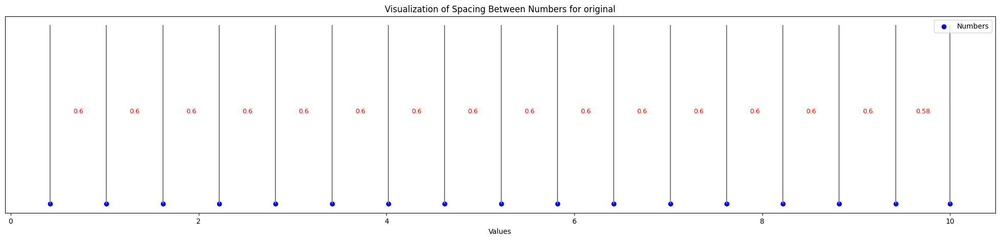

In [27]:
audio_file = "data/jasco/sep_drums_0.wav"
full_analysis(audio_file, "original")

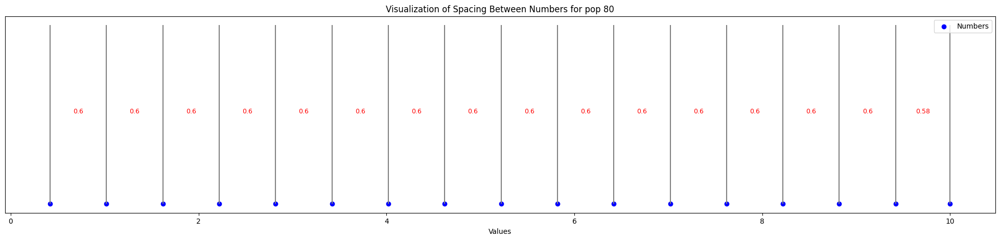

In [28]:
audio_file = "data/jasco/80s_0.wav"
full_analysis(audio_file, "pop 80")

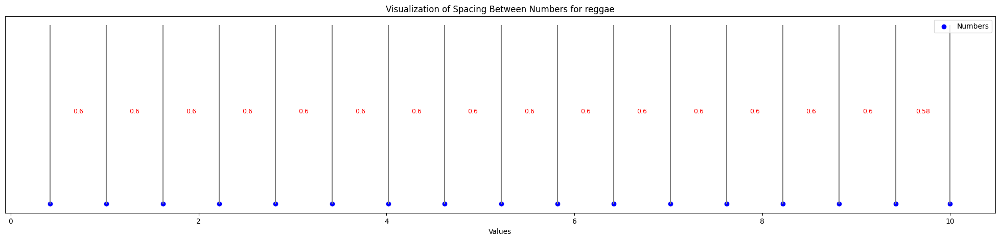

In [29]:
audio_file = "data/jasco/reggae_0.wav"
full_analysis(audio_file, "reggae")

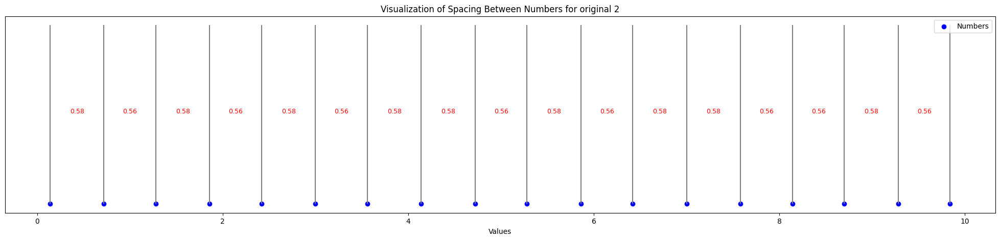

In [34]:
audio_file = "data/jasco/sep_drums_2.wav"
full_analysis(audio_file, "original 2")

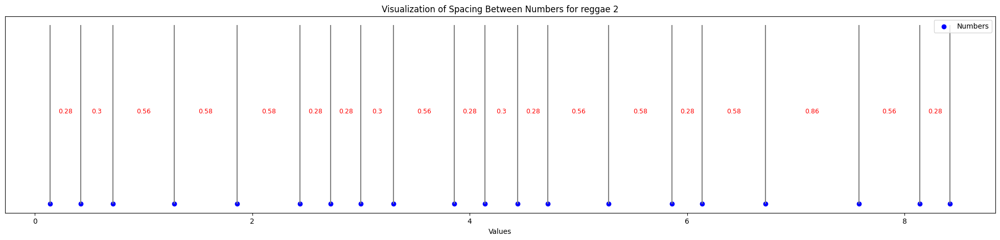

In [35]:
audio_file = "data/jasco/reggae_2.wav"
full_analysis(audio_file, "reggae 2")

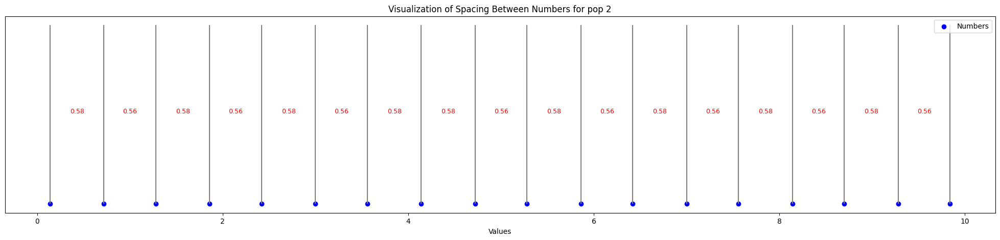

In [36]:
audio_file = "data/jasco/80s_2.wav"
full_analysis(audio_file, "pop 2")

# different agumentation methods

adding pause in the middle

In [26]:
import pandas as pd
from pydub import AudioSegment
def shift_beats(input_path, pause_position, pause_duration):
    # Load beat annotations from file
    #beats = pd.read_csv(input_path, header=None, names=['time'])
    with open (f"data/annotations/gtzan/annotations/beats/gtzan_classical_000{number}.beats", "r") as f:
#with open("data/annotations/asap/annotations/beats/Bach_Fugue_bwv_846_Shi05M.beats", "r") as f:
        beats = np.array([float(line.split()[0]) for line in f.readlines()])

    # Shift beats that come after the pause position
    shifted_beats = np.where(beats > pause_position, beats + pause_duration, beats)
    #beats['shifted_time'] = shifted_beats
    audio = AudioSegment.from_file(audio_path)

    # Create silence segment
    silence = AudioSegment.silent(duration=int(pause_duration * 1000))

    # Split audio at the pause position
    before_pause = audio[:int(pause_position * 1000)]
    after_pause = audio[int(pause_position * 1000):]

    # Concatenate the segments with silence
    shifted_audio = before_pause + silence + after_pause

    return shifted_beats, shifted_audio

    # Save the modified beats to a new file
number = "00"
audio_path = "data/gtzan_old/classical/classical.00000.wav"
shifted_beats, shifted_audio = shift_beats(audio_path, 5, 10)
with open (f"data/annotations/gtzan/annotations/beats/gtzan_classical_000{number}.beats", "r") as f:
#with open("data/annotations/asap/annotations/beats/Bach_Fugue_bwv_846_Shi05M.beats", "r") as f:
    ground_truth = np.array([float(line.split()[0]) for line in f.readlines()])
y, sr = librosa.load(audio_path, sr=None)
samples = np.array(shifted_audio.get_array_of_samples())
samples = samples.astype(np.float32) / 32768.0
click_dynamic = librosa.clicks(times=shifted_beats, sr=sr, click_freq=660,
                               click_duration=0.25, length=len(samples))
#print(beats_dynamic)

Audio(data=samples+click_dynamic, rate=sr)

In [34]:
shifted_audio

In [3]:
# shifted_audio.export("data/augmentation/pause/classical00_paus.wav", format="wav")
file2beats = File2Beats(checkpoint_path="final0", dbn=True)
audio_path = "data/augmentation/pause/classical00_paus.wav"
beats, downbeats = file2beats(audio_path)
y, sr = librosa.load(audio_path, sr=None)
click_dynamic = librosa.clicks(times=beats, sr=sr, click_freq=660,
                               click_duration=0.25, length=len(y))
#print(beats_dynamic)
ipd.display(ipd.Audio(y + click_dynamic, rate=sr))
#Audio(data=y+click_dynamic, rate=sr)

# checking if there are any pauses

In [40]:
import librosa
import numpy as np
from tqdm import tqdm
# Load audio
pauses_number = []
for i in range(100):
    path = get_audio_file(i, "rock")
    try:
        audio, sr = librosa.load(path, sr=None)
    except Exception as e:
        print(e)
        print(i)
# Compute RMS energy (frame-wise)
    rms = librosa.feature.rms(y=audio)[0]

    # Time stamps for each frame
    frames = range(len(rms))
    times = librosa.frames_to_time(frames, sr=sr)

    # Define threshold for silence (can be tuned)
    threshold = 0.001

    # Find frames below the threshold
    silent_frames = rms < threshold

    # Check if there is at least one continuous pause
    has_pause = np.any(silent_frames)
    if has_pause:
        print(i)
        pauses_number.append(i)

14


checking the average score for pieces with pauses

In [19]:
from tqdm import tqdm
from beat_this.model.pl_module import PLBeatThis
import numpy as np
piece = []
truth_dict = {}
num_tracks = 100
out = []
all_f1 = []
pl = PLBeatThis()
special_files = {}
genres = ["classical"]
file2beats = File2Beats(checkpoint_path="final2", dbn=False)
for genre in genres:
    print(f"prediction for {genre}, checkpoint is 2")
    for i in tqdm(pauses_number):
        numb_file = i
        #file = get_file(numb_file)
        #track = get_track(numb_file)
        file, track, audio_file = get_files(numb_file, genre)
        try:
            with open (file, "r", encoding = "utf-8") as f:
                ground_truth = np.array([float(line.split()[0]) for line in f.readlines()])
                truth_dict[numb_file] = ground_truth
                f.close()
            piece.append(track)
            #audio_file = get_audio_file(numb_file)
        
            beats, downbeats = file2beats(audio_file)
            res = pl.metrics(ground_truth, beats, step = 'test') 
            res['Cemgil'] = res['Cemgil'][0]
            f1_res = res["F-measure"]
            if f1_res < 0.5 or f1_res > 0.9:
                special_files[file] = f1_res
            out.append(res)
        except Exception as e:
            print(e)
            print(f"something went wrong with the file {audio_file}")
    metrics = {key: [d[key] for d in out 
                     
                     
                     ] for key in out[0].keys()}
    averaged_metrics = {k: np.mean(v) for k, v in metrics.items()}
    all_f1.append(averaged_metrics["F-measure"])
    print(f"Metrics (beat) for {genre}")
    for k, v in averaged_metrics.items():
        print(f"{k}: {v}")
print(all_f1)

prediction for classical, checkpoint is 2


100%|██████████| 12/12 [00:43<00:00,  3.60s/it]

Metrics (beat) for classical
F-measure: 0.5755290821966146
Cemgil: 0.4677019953731458
CMLt: 0.3495999152428308
AMLt: 0.5656748336711337
[0.5755290821966146]


# clustering (didn't try it yet)

In [ ]:
import openl3
import soundfile as sf

audio, sr = sf.read("track.wav")
embeddings, ts = openl3.get_audio_embedding(audio, sr, content_type="music", embedding_size=512)


14


In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
reduced = PCA(n_components=50).fit_transform(embeddings)

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5)
labels = kmeans.fit_predict(reduced)

# trying to predict downbeat

In [15]:
file,b,c =get_files(1, "blues")


In [10]:
import numpy as np
with open (file, "r", encoding = "utf-8") as f:
                ground_truth = np.array([float(line.split()[0]) for line in f.readlines()])
                # truth_dict[numb_file] = ground_truth
                # f.close()

In [18]:
file

'data/annotations/gtzan/annotations/beats/gtzan_blues_00001.beats'

In [16]:
beat_annotation = np.loadtxt(file)

In [6]:
from tqdm import tqdm
from beat_this.model.pl_module import PLBeatThis
import numpy as np

piece = []
truth_dict = {}
num_tracks = 100
out_beat = []
out_downbeat = []
all_f1 = {"beat":[], "downbeat": []}
pl = PLBeatThis()
special_files = {}
genres = [
    "blues",
    "classical",
    "country",
    "disco",
    "hiphop",
    "jazz",
    "metal",
    "pop",
    "reggae",
    "rock"
]
file2beats = File2Beats(checkpoint_path="final0", dbn=False)
for genre in genres:
    print(f"prediction for {genre}, checkpoint is 2")
    for i in tqdm(range(num_tracks)):
        numb_file = i
        file, track, audio_file = get_files(numb_file, genre)
        try:
            beat_annotation = np.loadtxt(file)
            beats_truth = beat_annotation[:,0]
            downbeats_truth = beat_annotation[:,1].astype(np.int32)
            downbeats_masked = [True if beat == 1 else False for beat in downbeats_truth ]
            downbeats_truth = beats_truth[downbeats_masked]        
            beats, downbeats = file2beats(audio_file)

            res_beat = pl.metrics(beats_truth, beats, step = 'test') 
            res_beat['Cemgil'] = res_beat['Cemgil'][0]
            res_downbeat = pl.metrics(downbeats_truth, downbeats, step = 'test') 
            res_downbeat['Cemgil'] = res_downbeat['Cemgil'][0]
            out_beat.append(res_beat)
            out_downbeat.append(res_downbeat)
        except Exception as e:
            print(e)
            print(f"something went wrong with the file {audio_file}")
    outs = {"beat": out_beat, "downbeat": out_downbeat}
    for (type, out) in outs.items():
        metrics = {key: [d[key] for d in out 
                        
                        
                        ] for key in out[0].keys()}
        averaged_metrics = {k: np.mean(v) for k, v in metrics.items()}
        all_f1[type].append(averaged_metrics["F-measure"])
        print(f"Metrics {type} for {genre} with dbn lambda = 50")
        for k, v in averaged_metrics.items():
            print(f"{k}: {v}")
print(all_f1)

prediction for blues, checkpoint is 2


100%|██████████| 100/100 [06:03<00:00,  3.64s/it]


Metrics beat for blues with dbn lambda = 50
F-measure: 0.8310827985672785
Cemgil: 0.7254316479336365
CMLt: 0.6953289498115057
AMLt: 0.8365221220672562
Metrics downbeat for blues with dbn lambda = 50
F-measure: 0.6386347928982754
Cemgil: 0.5604618764076618
CMLt: 0.48827849696041753
AMLt: 0.645404396942296
prediction for classical, checkpoint is 2


 39%|███▉      | 39/100 [02:24<03:27,  3.40s/it]c:\Polina\master\thesis\beat_this\beat_env\Lib\site-packages\mir_eval\beat.py:463: UserWarning: Only one estimated beat was provided, so beat intervals cannot be computed.
  warnings.warn(
100%|██████████| 100/100 [06:05<00:00,  3.66s/it]


Metrics beat for classical with dbn lambda = 50
F-measure: 0.7450866988151952
Cemgil: 0.6209753253637821
CMLt: 0.6002841565812527
AMLt: 0.7454167009396329
Metrics downbeat for classical with dbn lambda = 50
F-measure: 0.5764354423268963
Cemgil: 0.4820396094956258
CMLt: 0.3947032729001009
AMLt: 0.5677114982528108
prediction for country, checkpoint is 2


100%|██████████| 100/100 [05:54<00:00,  3.55s/it]


Metrics beat for country with dbn lambda = 50
F-measure: 0.8112698964722578
Cemgil: 0.7020191781874787
CMLt: 0.68743327201859
AMLt: 0.8145383016176432
Metrics downbeat for country with dbn lambda = 50
F-measure: 0.6893992430640915
Cemgil: 0.5994048768517669
CMLt: 0.5310253233144366
AMLt: 0.6739589139348936
prediction for disco, checkpoint is 2


100%|██████████| 100/100 [06:01<00:00,  3.62s/it]


Metrics beat for disco with dbn lambda = 50
F-measure: 0.8500078097683675
Cemgil: 0.7513585796404305
CMLt: 0.7516272057836546
AMLt: 0.8528100782825336
Metrics downbeat for disco with dbn lambda = 50
F-measure: 0.751163254285907
Cemgil: 0.6648505769064994
CMLt: 0.6237674684787888
AMLt: 0.7439142920194386
prediction for hiphop, checkpoint is 2


100%|██████████| 100/100 [06:05<00:00,  3.66s/it]


Metrics beat for hiphop with dbn lambda = 50
F-measure: 0.8749271923357073
Cemgil: 0.7784495226887904
CMLt: 0.7905579127610357
AMLt: 0.8783401825353008
Metrics downbeat for hiphop with dbn lambda = 50
F-measure: 0.7805095588578097
Cemgil: 0.6943604429965695
CMLt: 0.667925278185511
AMLt: 0.7811478581542045
prediction for jazz, checkpoint is 2


  3%|▎         | 3/100 [00:10<05:43,  3.54s/it]

too many indices for array: array is 1-dimensional, but 2 were indexed
something went wrong with the file data/gtzan_old/jazz/jazz.00003.wav


  9%|▉         | 9/100 [00:28<05:04,  3.35s/it]

too many indices for array: array is 1-dimensional, but 2 were indexed
something went wrong with the file data/gtzan_old/jazz/jazz.00009.wav
too many indices for array: array is 1-dimensional, but 2 were indexed
something went wrong with the file data/gtzan_old/jazz/jazz.00010.wav


 14%|█▍        | 14/100 [00:39<03:55,  2.74s/it]

too many indices for array: array is 1-dimensional, but 2 were indexed
something went wrong with the file data/gtzan_old/jazz/jazz.00014.wav


 18%|█▊        | 18/100 [00:50<03:57,  2.90s/it]

too many indices for array: array is 1-dimensional, but 2 were indexed
something went wrong with the file data/gtzan_old/jazz/jazz.00018.wav


 20%|██        | 20/100 [00:53<03:16,  2.45s/it]

too many indices for array: array is 1-dimensional, but 2 were indexed
something went wrong with the file data/gtzan_old/jazz/jazz.00020.wav


 55%|█████▌    | 55/100 [03:03<02:10,  2.91s/it]

Could not load audio from "data/gtzan_old/jazz/jazz.00054.wav".
something went wrong with the file data/gtzan_old/jazz/jazz.00054.wav


100%|██████████| 100/100 [05:50<00:00,  3.50s/it]


Metrics beat for jazz with dbn lambda = 50
F-measure: 0.875956469744691
Cemgil: 0.7763834279610494
CMLt: 0.7846663622842861
AMLt: 0.8788002289963711
Metrics downbeat for jazz with dbn lambda = 50
F-measure: 0.7752494234646566
Cemgil: 0.6871034008245653
CMLt: 0.6604042088513314
AMLt: 0.7739373255508939
prediction for metal, checkpoint is 2


100%|██████████| 100/100 [06:20<00:00,  3.80s/it]


Metrics beat for metal with dbn lambda = 50
F-measure: 0.8760432167272658
Cemgil: 0.7811274088627375
CMLt: 0.7809580652795058
AMLt: 0.8813612633389212
Metrics downbeat for metal with dbn lambda = 50
F-measure: 0.7743032468694117
Cemgil: 0.6900308465470277
CMLt: 0.6602641029364046
AMLt: 0.7748472793463725
prediction for pop, checkpoint is 2


100%|██████████| 100/100 [06:37<00:00,  3.97s/it]


Metrics beat for pop with dbn lambda = 50
F-measure: 0.8857795929127041
Cemgil: 0.7948344939150156
CMLt: 0.7968471030942821
AMLt: 0.8920917720612977
Metrics downbeat for pop with dbn lambda = 50
F-measure: 0.7950517066192063
Cemgil: 0.7134153330030377
CMLt: 0.6880770295113692
AMLt: 0.7956961461807367
prediction for reggae, checkpoint is 2


 86%|████████▌ | 86/100 [06:02<00:58,  4.15s/it]

data/annotations/gtzan/annotations/beats/gtzan_reggae_00086.beats not found.
something went wrong with the file data/gtzan_old/reggae/reggae.00086.wav


100%|██████████| 100/100 [06:56<00:00,  4.17s/it]


Metrics beat for reggae with dbn lambda = 50
F-measure: 0.8881554142237585
Cemgil: 0.8000335978816352
CMLt: 0.7907895782829371
AMLt: 0.9006459364037396
Metrics downbeat for reggae with dbn lambda = 50
F-measure: 0.7831184264354684
Cemgil: 0.7054095165067232
CMLt: 0.6660587220543955
AMLt: 0.7916620100631321
prediction for rock, checkpoint is 2


100%|██████████| 100/100 [06:52<00:00,  4.13s/it]

Metrics beat for rock with dbn lambda = 50
F-measure: 0.8923273962319264
Cemgil: 0.8038973072618218
CMLt: 0.7985102301988266
AMLt: 0.9029933912309748
Metrics downbeat for rock with dbn lambda = 50
F-measure: 0.7869059896941217
Cemgil: 0.7083601101874365
CMLt: 0.6775389447994888
AMLt: 0.7990316113746703
{'beat': [0.8310827985672785, 0.7450866988151952, 0.8112698964722578, 0.8500078097683675, 0.8749271923357073, 0.875956469744691, 0.8760432167272658, 0.8857795929127041, 0.8881554142237585, 0.8923273962319264], 'downbeat': [0.6386347928982754, 0.5764354423268963, 0.6893992430640915, 0.751163254285907, 0.7805095588578097, 0.7752494234646566, 0.7743032468694117, 0.7950517066192063, 0.7831184264354684, 0.7869059896941217]}


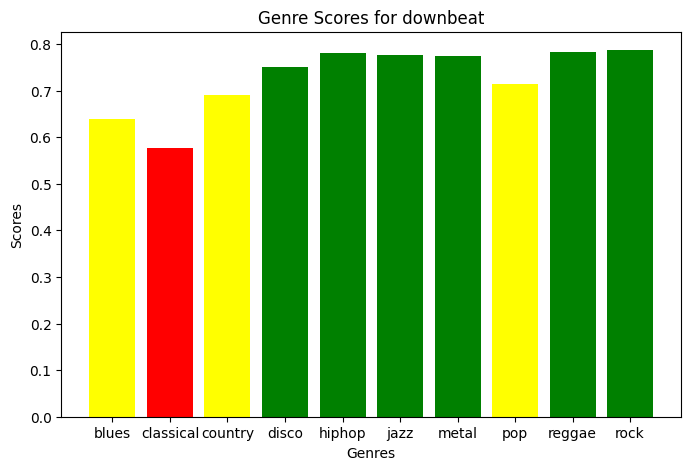

In [16]:
scores = [0.6386347928982754, 0.5764354423268963, 0.6893992430640915,  0.751163254285907,
          0.7805095588578097,  0.7752494234646566, 0.7743032468694117,  0.7134153330030377, 0.7831184264354684, 0.7869059896941217 ]
np.mean(np.array(scores))
genres = ["blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]
genres_results = dict(zip(genres,scores))
genres_results
import matplotlib.pyplot as plt
plt.figure(figsize=(8, 5))
colors = []
for score in genres_results.values():
    if score < 0.6:
        colors.append('red')
    elif score > 0.75:
        colors.append('green')

    elif score > 0.6:
        colors.append('yellow')
    else:
        colors.append('blue')
plt.bar(genres_results.keys(), genres_results.values(), color = colors)
plt.xlabel('Genres')
plt.ylabel('Scores')
#plt.ylim(0.6,1)
plt.title('Genre Scores for downbeat')
plt.show()

In [24]:

np.set_printoptions(suppress=True, precision=4)
beats = beat_annotation[:,0]
downbeats = beat_annotation[:,1].astype(np.int32)

In [39]:
downbeats_masked = [True if beat == 1 else False for beat in downbeats ]

In [ ]:
import torch
ckpt = torch.load("/home/ui556004/projects/beat_this/beat_this/final2.ckpt", map_location="cpu")

: 

In [1]:
1e-1

0.1